In [1]:
%matplotlib inline
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.cluster import MiniBatchKMeans,KMeans,SpectralClustering
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import r2_score

In [2]:
train_raw = pd.read_csv("train.csv")
test_raw = pd.read_csv("data_for_test.csv")

In [57]:
train_encode.shape

(44949, 224)

In [4]:
train_encode = pd.read_csv("train_encode2.csv")
test_encode = pd.read_csv("test_encode2.csv")

In [1]:
temp = train_encode.loc[train_encode.duration > 73].groupby('patient_id').apply(lambda x: x.sample(50)).droplevel(0)

In [59]:
temp1 = pd.concat([train_encode.loc[train_encode.duration <= 73], temp])

In [75]:
patient_id = temp1.patient_id.unique()
train_id_index = np.random.choice(patient_id,int(0.8*len(patient_id)),replace=False)

val = temp1.loc[~temp1.patient_id.isin(train_id_index)]
train = temp1.loc[temp1.patient_id.isin(train_id_index)]

In [65]:
import lightgbm as lgb

In [73]:
temp1.patient_id

0           0
1           1
2           1
3           1
4           1
         ... 
44939    2878
44931    2878
44908    2878
44863    2878
44902    2878
Name: patient_id, Length: 38340, dtype: int64

[]

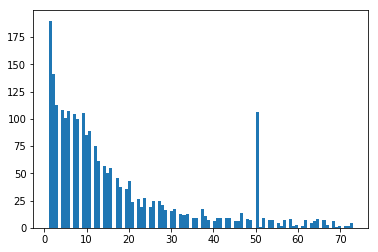

In [83]:
plt.hist(temp1.groupby('patient_id')['key'].count(), bins=100)
plt.plot()

In [107]:
train_data = lgb.Dataset(train.drop(columns = ['y_mean_MAP', 'y_mean_HR','log_y_mean_MAP','sqrt_y_mean_MAP',
                                              'log_y_mean_HR', 'sqrt_y_mean_HR', 'key', 'patient_id', 'key_label']),
                         label = train['y_mean_MAP'], 
                         categorical_feature=['x3'])
model = lgb.train(params = {'metric': 'MSE'} ,train_set = train_data)
print(r2_score(model.predict(train.drop(columns = ['y_mean_MAP', 'y_mean_HR','log_y_mean_MAP','sqrt_y_mean_MAP',
                                              'log_y_mean_HR', 'sqrt_y_mean_HR', 'key', 'patient_id', 'key_label'])), train[['y_mean_MAP']]))
print(r2_score(model.predict(val.drop(columns = ['y_mean_MAP', 'y_mean_HR','log_y_mean_MAP','sqrt_y_mean_MAP',
                                              'log_y_mean_HR', 'sqrt_y_mean_HR', 'key', 'patient_id', 'key_label'])), val[['y_mean_MAP']]))


/anaconda3/lib/python3.7/site-packages/lightgbm/basic.py:1291: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')


0.9235402278912836
0.8581789690701246


In [81]:
train_data = lgb.Dataset(train.drop(columns = ['y_mean_MAP', 'y_mean_HR','log_y_mean_MAP','sqrt_y_mean_MAP',
                                              'log_y_mean_HR', 'sqrt_y_mean_HR', 'key', 'patient_id']),
                         label = train['y_mean_HR'], 
                         categorical_feature=['x3'])
model = lgb.train(params = {'metric': 'MSE'} ,train_set = train_data)
print(r2_score(model.predict(train.drop(columns = ['y_mean_MAP', 'y_mean_HR','log_y_mean_MAP','sqrt_y_mean_MAP',
                                              'log_y_mean_HR', 'sqrt_y_mean_HR', 'key', 'patient_id'])), train[['y_mean_HR']]))
print(r2_score(model.predict(val.drop(columns = ['y_mean_MAP', 'y_mean_HR','log_y_mean_MAP','sqrt_y_mean_MAP',
                                              'log_y_mean_HR', 'sqrt_y_mean_HR', 'key', 'patient_id'])), val[['y_mean_HR']]))

/anaconda3/lib/python3.7/site-packages/lightgbm/basic.py:1291: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')


0.9691181706511605
0.9550268424292135


In [101]:
train_data = lgb.Dataset(temp1.drop(columns = ['y_mean_MAP', 'y_mean_HR','log_y_mean_MAP','sqrt_y_mean_MAP',
                                              'log_y_mean_HR', 'sqrt_y_mean_HR', 'key', 'patient_id', 'key_label']),
                         label = temp1['y_mean_HR'], 
                         categorical_feature=['x3'])
model = lgb.train(params = {'metric': 'MSE'} ,train_set = train_data)
print(r2_score(model.predict(temp1.drop(columns = ['y_mean_MAP', 'y_mean_HR','log_y_mean_MAP','sqrt_y_mean_MAP',
                                              'log_y_mean_HR', 'sqrt_y_mean_HR', 'key', 'patient_id', 'key_label'])), temp1[['y_mean_HR']]))


0.9679662544737683


In [102]:
model.predict(test_encode.drop(columns = ['key', 'patient_id']))

array([71.28176885, 72.944599  , 75.59190795, ..., 83.39710801,
       84.38373781, 84.38373781])

In [118]:
final = test_encode[['key', 'y_mean_HR']]
final.columns = ['key', 'HR']

In [111]:
sample = pd.read_csv('submit_oversample_log2.csv')
sample.head()

,key,y_mean_MAP,y_mean_HR
0,1005-1,63.503256,54.939878
1,1005-2,62.778380,64.952136
2,1005-3,65.319156,74.656708
3,1005-4,78.467301,71.663162
4,1005-5,72.850996,78.051323


In [122]:
final = pd.merge(sample, final, on='key', how = 'left')[['key', 'y_mean_MAP', 'HR']]
final.columns = ['key', 'y_mean_MAP', 'y_mean_HR']

In [130]:
# final.to_csv('final_submission10.csv', index=False)

In [115]:
sample.key.values == test_encode[['key', 'y_mean_HR']].sort_values(by = 'key').key.values

array([ True, False, False, ..., False, False, False])

In [97]:
set(temp1.drop(columns = ['y_mean_MAP', 'y_mean_HR','log_y_mean_MAP','sqrt_y_mean_MAP',
                                              'log_y_mean_HR', 'sqrt_y_mean_HR', 'key', 'patient_id']).columns).\
difference(set(test_encode.drop(columns = ['patient_id', 'key']).columns))

{'key_label'}

(array([552., 412., 354., 223., 162.,  96.,  90.,  61.,  43.,  41.,  36.,
         34.,  23.,  20.,  20.,  19.,  18.,  11.,  11.,   7.,   6.,   6.,
          5.,   9.,   5.,   3.,   6.,   6.,   2.,   3.,   1.,   3.,   3.,
          1.,   4.,   3.,   2.,   1.,   1.,   1.,   3.,   3.,   0.,   1.,
          1.,   3.,   1.,   0.,   4.,   1.]),
 array([  1.  ,   4.94,   8.88,  12.82,  16.76,  20.7 ,  24.64,  28.58,
         32.52,  36.46,  40.4 ,  44.34,  48.28,  52.22,  56.16,  60.1 ,
         64.04,  67.98,  71.92,  75.86,  79.8 ,  83.74,  87.68,  91.62,
         95.56,  99.5 , 103.44, 107.38, 111.32, 115.26, 119.2 , 123.14,
        127.08, 131.02, 134.96, 138.9 , 142.84, 146.78, 150.72, 154.66,
        158.6 , 162.54, 166.48, 170.42, 174.36, 178.3 , 182.24, 186.18,
        190.12, 194.06, 198.  ]),
 <a list of 50 Patch objects>)

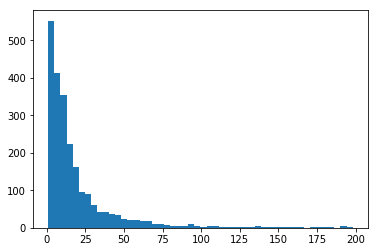

In [104]:
plt.hist(train_raw.patient_id.value_counts()/30, bins=50)

In [145]:
# without time series features
test_encode.columns

Index(['Unnamed: 0', 'patient_id', 'key', 'gender', 'age', 'x1', 'x2', 'x3',
       'x4', 'x5', 'x6', 'xx1', 'xx2', 'xx3', 'xx4', 'xx5', 'duration',
       'xx1_min', 'xx1_max', 'xx1_var', 'xx2_min', 'xx2_max', 'xx2_var',
       'xx3_min', 'xx3_max', 'xx3_var', 'xx4_min', 'xx4_max', 'xx4_var',
       'xx5_min', 'xx5_max', 'xx5_var', 'xx1_cluster', 'xx2_cluster',
       'xx3_cluster', 'xx4_cluster', 'xx5_cluster', 'age_mean_enc_y_mean_MAP',
       'age_mean_enc_y_mean_HR', 'x1_mean_enc_y_mean_MAP',
       'x1_mean_enc_y_mean_HR', 'x2_mean_enc_y_mean_MAP',
       'x2_mean_enc_y_mean_HR', 'xx1_cluster_mean_enc_y_mean_MAP',
       'xx1_cluster_mean_enc_y_mean_HR', 'xx2_cluster_mean_enc_y_mean_MAP',
       'xx2_cluster_mean_enc_y_mean_HR', 'xx3_cluster_mean_enc_y_mean_MAP',
       'xx3_cluster_mean_enc_y_mean_HR', 'xx4_cluster_mean_enc_y_mean_MAP',
       'xx4_cluster_mean_enc_y_mean_HR', 'xx5_cluster_mean_enc_y_mean_MAP',
       'xx5_cluster_mean_enc_y_mean_HR'],
      dtype='object')

In [146]:
train_encode.columns

Index(['Unnamed: 0', 'patient_id', 'key', 'gender', 'age', 'x1', 'x2', 'x3',
       'x4', 'x5', 'x6', 'xx1', 'xx2', 'xx3', 'xx4', 'xx5', 'y_mean_MAP',
       'y_mean_HR', 'log_y_mean_MAP', 'sqrt_y_mean_MAP', 'log_y_mean_HR',
       'sqrt_y_mean_HR', 'key_label', 'duration', 'xx1_min', 'xx1_max',
       'xx1_var', 'xx2_min', 'xx2_max', 'xx2_var', 'xx3_min', 'xx3_max',
       'xx3_var', 'xx4_min', 'xx4_max', 'xx4_var', 'xx5_min', 'xx5_max',
       'xx5_var', 'xx1_cluster', 'xx2_cluster', 'xx3_cluster', 'xx4_cluster',
       'xx5_cluster', 'age_mean_enc_y_mean_MAP', 'age_mean_enc_y_mean_HR',
       'x1_mean_enc_y_mean_MAP', 'x1_mean_enc_y_mean_HR',
       'x2_mean_enc_y_mean_MAP', 'x2_mean_enc_y_mean_HR',
       'xx1_cluster_mean_enc_y_mean_MAP', 'xx1_cluster_mean_enc_y_mean_HR',
       'xx2_cluster_mean_enc_y_mean_MAP', 'xx2_cluster_mean_enc_y_mean_HR',
       'xx3_cluster_mean_enc_y_mean_MAP', 'xx3_cluster_mean_enc_y_mean_HR',
       'xx4_cluster_mean_enc_y_mean_MAP', 'xx4_cluster_mean_

### we need time series of xx1-xx5

In [147]:
def pivot_transform(data_raw,data_encode):
    temp = data_raw[["key", 'xx1', "xx2", "xx3", "xx4", "xx5"]]
    temp["index"] = temp.groupby("key")["xx1", "xx2"].cumcount()+1
    temp_pivot = temp.pivot(index='key', columns='index', values=[
                            "xx1", "xx2", "xx3", "xx4", "xx5"])
    temp_pivot.columns = [str(x)+"|"+str(y) for x, y in list(temp_pivot.columns)]
    temp_pivot = temp_pivot.reset_index()
    data_encode = pd.merge(data_encode,temp_pivot,on="key",how="inner")
    return data_encode

In [148]:
train_encode=pivot_transform(train_raw, train_encode)
test_encode=pivot_transform(test_raw, test_encode)

/opt/anaconda3/envs/ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [149]:
train_encode.shape

(44949, 210)

In [150]:
test_encode.shape

(13019, 203)

### probably the shape of time series affect on the target, so try to do time series clustering on xx1|1-xx1|30, xx2|1-xx2|30, xx3|1-xx3|30, xx4|1-xx4|30, xx5|1-xx5|30 

In [151]:
#try n_clusters=100
xx1cols = [x for x in train_encode.columns if "xx1|"in x]
X1 = train_encode[xx1cols].values
kmeans1 = KMeans(n_clusters=100).fit(X1)
train_encode['xx1_series_cluster'] = kmeans1.predict(X1)
test_encode['xx1_series_cluster'] = kmeans1.predict(test_encode[xx1cols].values)

xx2cols = [x for x in train_encode.columns if "xx2|"in x]
X2 = train_encode[xx2cols].values
kmeans2 = KMeans(n_clusters=100).fit(X2)
train_encode['xx2_series_cluster'] = kmeans2.predict(X2)
test_encode['xx2_series_cluster'] = kmeans2.predict(test_encode[xx2cols].values)

xx3cols = [x for x in train_encode.columns if "xx3|"in x]
X3 = train_encode[xx3cols].values
kmeans3 = KMeans(n_clusters=100).fit(X3)
train_encode['xx3_series_cluster'] = kmeans3.predict(X3)
test_encode['xx3_series_cluster'] = kmeans3.predict(test_encode[xx3cols].values)

xx4cols = [x for x in train_encode.columns if "xx4|"in x]
X4 = train_encode[xx4cols].values
kmeans4 = KMeans(n_clusters=100).fit(X4)
train_encode['xx4_series_cluster'] = kmeans4.predict(X4)
test_encode['xx4_series_cluster'] = kmeans4.predict(test_encode[xx4cols].values)

xx5cols = [x for x in train_encode.columns if "xx5|"in x]
X5 = train_encode[xx5cols].values
kmeans5 = KMeans(n_clusters=100).fit(X5)
train_encode['xx5_series_cluster'] = kmeans5.predict(X5)
test_encode['xx5_series_cluster'] = kmeans5.predict(test_encode[xx5cols].values)


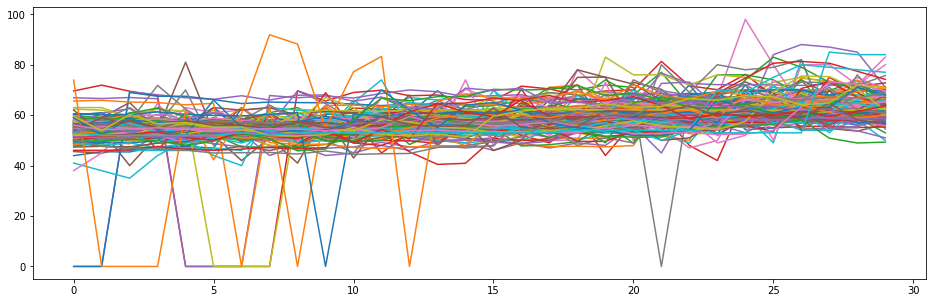

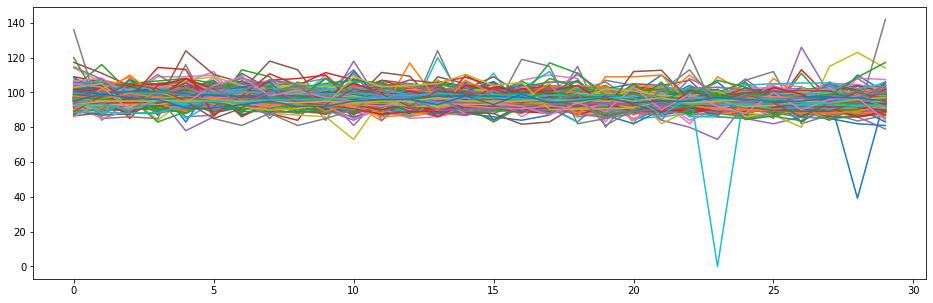

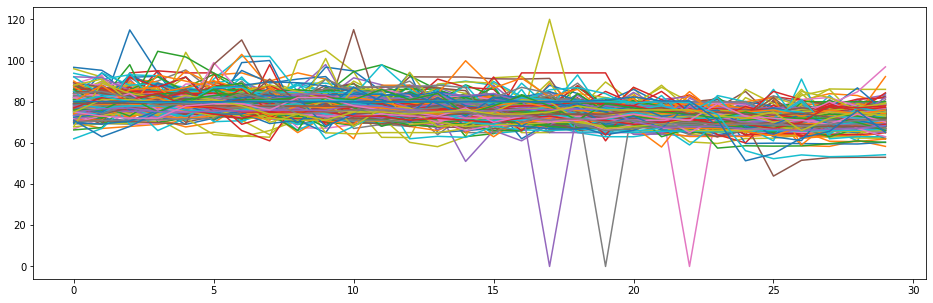

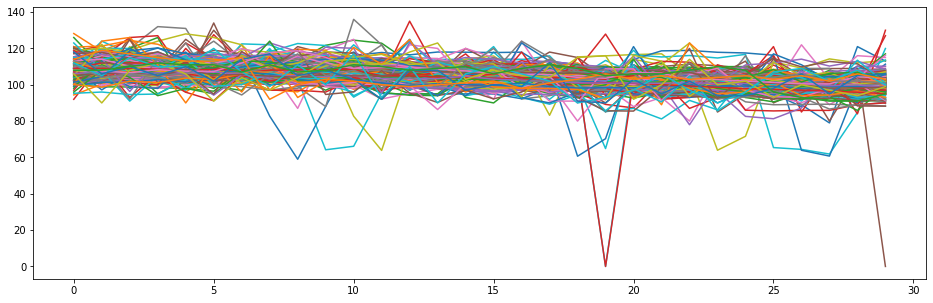

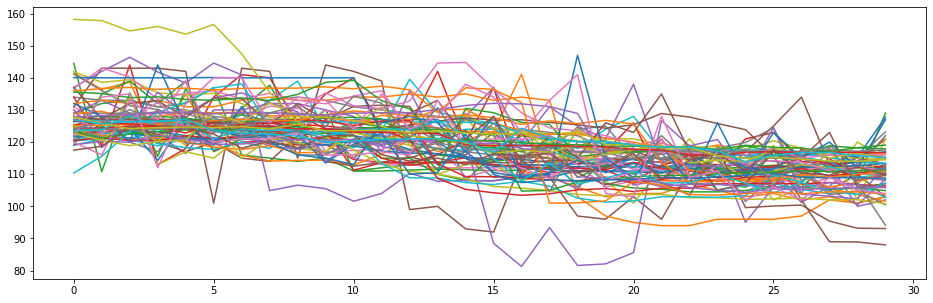

...

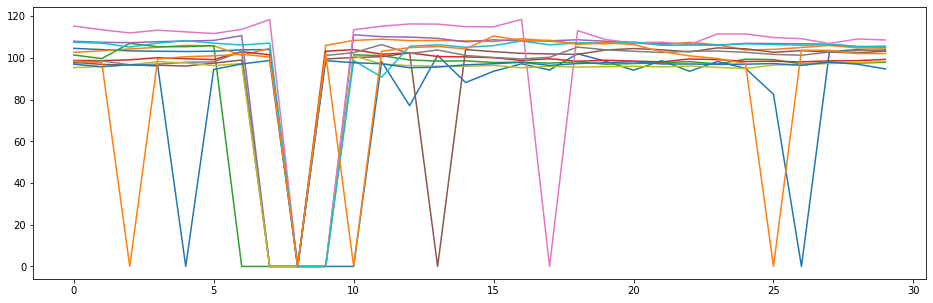

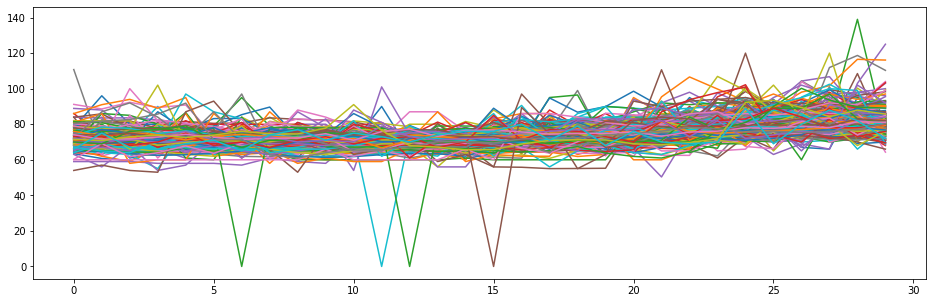

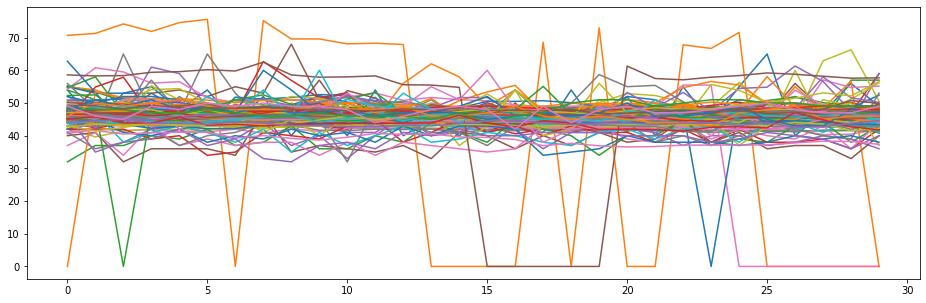

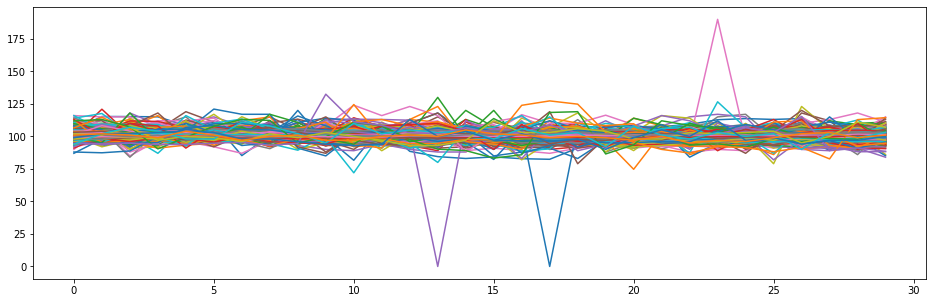

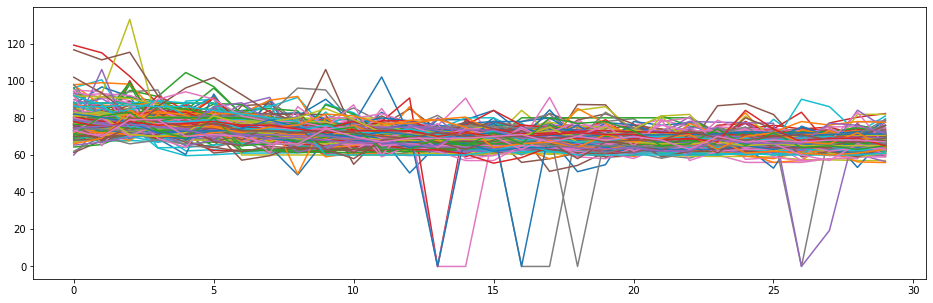

In [139]:
"""for c in range(100):
    cluster = data_encode.loc[data_encode['xx1_series_cluster'] == c]
    temp = cluster[xx1cols].reset_index(drop=True)
    plt.figure(figsize=(16,5))
    for row in range(temp.shape[0]):
        plt.plot(temp.loc[row].values)
    plt.show()"""

### mean encoding time series cluster

In [152]:
from sklearn.model_selection import KFold


def reg_target_encoding(train, col, splits=5):
    """ Computes regularize mean encoding.
    Inputs:
       train: training dataframe

    """

    kf = KFold(n_splits=splits)
    for train_index, val_index in kf.split(train):
        for target in ['y_mean_MAP', 'y_mean_HR']:
            mean_col = train.iloc[train_index].groupby(col)[target].mean()
            global_mean = train.iloc[train_index][target].mean()
            newcol = col + "_mean_enc_" + target
            train.loc[val_index, newcol] = train.loc[val_index, col].map(mean_col)
            train.loc[val_index, newcol] = train.loc[val_index, newcol].fillna(global_mean)

def mean_encoding_test(test, train, col):
    """ Computes target enconding for test data.
    
    This is similar to how we do validation
    """
    for target in ['y_mean_MAP', 'y_mean_HR']:
        mean_col = train.groupby(col)[target].mean()
        global_mean = train[target].mean()
        newcol = col + "_mean_enc_" + target
        test[newcol] = test[col].map(mean_col)
        test[newcol] = test[newcol].fillna(global_mean)    

In [153]:
train_encode.columns

Index(['Unnamed: 0', 'patient_id', 'key', 'gender', 'age', 'x1', 'x2', 'x3',
       'x4', 'x5',
       ...
       'xx5|26', 'xx5|27', 'xx5|28', 'xx5|29', 'xx5|30', 'xx1_series_cluster',
       'xx2_series_cluster', 'xx3_series_cluster', 'xx4_series_cluster',
       'xx5_series_cluster'],
      dtype='object', length=215)

In [154]:
cols_encode = ['xx1_series_cluster', 'xx2_series_cluster', 'xx3_series_cluster', 'xx4_series_cluster',
               'xx5_series_cluster']
for col in cols_encode:
    reg_target_encoding(train_encode, col=col, splits=5)
    mean_encoding_test(test_encode, train_encode, col=col)

In [155]:
train_encode

,Unnamed: 0,patient_id,key,gender,age,x1,x2,x3,x4,x5,...,xx1_series_cluster_mean_enc_y_mean_MAP,xx1_series_cluster_mean_enc_y_mean_HR,xx2_series_cluster_mean_enc_y_mean_MAP,xx2_series_cluster_mean_enc_y_mean_HR,xx3_series_cluster_mean_enc_y_mean_MAP,xx3_series_cluster_mean_enc_y_mean_HR,xx4_series_cluster_mean_enc_y_mean_MAP,xx4_series_cluster_mean_enc_y_mean_HR,xx5_series_cluster_mean_enc_y_mean_MAP,xx5_series_cluster_mean_enc_y_mean_HR
0,0,0,0-28,0,72,39,5,1,0,0,...,77.112210,79.892217,79.400783,82.197930,74.686441,83.090736,91.843823,85.621159,88.489210,83.926928
1,1,1,1-10,1,64,55,9,5,1,0,...,81.113468,73.074885,79.400783,82.197930,72.961858,84.205022,79.662140,84.376117,74.851149,84.118168
2,2,1,1-11,1,64,55,9,5,1,0,...,77.352307,72.376686,79.400783,82.197930,78.751878,83.418520,79.662140,84.376117,74.991651,83.672705
3,3,1,1-14,1,64,55,9,5,1,0,...,85.775610,109.143170,79.400783,82.197930,80.992417,81.289475,90.419828,85.590432,85.344930,84.908975
4,4,1,1-15,1,64,55,9,5,1,0,...,79.022811,142.650835,79.400783,82.197930,88.421154,84.974287,99.888628,91.355299,94.257436,86.814124
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44944,44944,2878,2878-87,0,74,30,3,5,0,0,...,81.937396,107.008675,78.977478,82.980305,79.042634,84.591654,84.930141,85.131438,89.664348,84.877754
44945,44945,2878,2878-88,0,74,30,3,5,0,0,...,81.172960,101.653162,78.098846,84.263395,80.442359,80.768350,84.254376,85.356261,87.135747,82.788193
44946,44946,2878,2878-89,0,74,30,3,5,0,0,...,79.464478,95.289276,78.098846,84.263395,82.532425,83.762734,85.773527,84.358118,89.915784,84.055613
44947,44947,2878,2878-90,0,74,30,3,5,0,0,...,82.334863,101.491157,79.488485,82.762937,94.128496,80.556803,91.314616,84.589235,97.827689,83.378444


In [161]:
train_encode[train_encode.columns[1:]].to_csv("train_encode2.csv",index=None)
test_encode[test_encode.columns[1:]].to_csv("test_encode2.csv",index=None)

In [135]:
train_encode = pd.read_csv("train_encode2.csv")
test_encode = pd.read_csv("test_encode2.csv")

### train-validation split

In [175]:
train_encode.shape

(44949, 284)

In [176]:
# split by patient_id

patient_id = train_encode.patient_id.unique()
train_id_index = np.random.choice(patient_id,int(0.8*len(patient_id)),replace=False)


In [177]:
val = train_encode.loc[~train_encode.patient_id.isin(train_id_index)]

In [178]:
train = train_encode.loc[train_encode.patient_id.isin(train_id_index)]

In [179]:
train.shape

(35654, 284)

In [180]:
val.shape

(9295, 284)

## first model: randomforest

In [181]:
test_encode.columns

Index(['patient_id', 'key', 'gender', 'age', 'x1', 'x2', 'x3', 'x4', 'x5',
       'x6',
       ...
       'xx5|delta21', 'xx5|delta22', 'xx5|delta23', 'xx5|delta24',
       'xx5|delta25', 'xx5|delta26', 'xx5|delta27', 'xx5|delta28',
       'xx5|delta29', 'xx5_delta_cluster'],
      dtype='object', length=277)

In [182]:
features=test_encode.columns[2:]
len(features)

275

In [183]:
X_train = train[features]
y_train_MAP = train.y_mean_MAP
y_train_HR = train.y_mean_HR

In [48]:
X_val = val[features]
y_val_MAP = val.y_mean_MAP
y_val_HR = val.y_mean_HR

In [57]:
rf_MAP = RandomForestRegressor(n_estimators=100, max_depth=20, 
                               min_samples_split=40, min_samples_leaf=20)

In [58]:
rf_MAP.fit(X_train, y_train_MAP)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=20,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=20, min_samples_split=40,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [59]:
y_train_MAP_pred = rf_MAP.predict(X_train)
r2_score(y_train_MAP, y_train_MAP_pred)

0.925326116503961

In [60]:
y_val_MAP_pred = rf_MAP.predict(X_val)
r2_score(y_val_MAP, y_val_MAP_pred)

0.919310185019333

In [61]:
rf_HR = RandomForestRegressor(n_estimators=100, max_depth=20, min_samples_split=40, min_samples_leaf=20)

In [62]:
rf_HR.fit(X_train, y_train_HR)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=20,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=20, min_samples_split=40,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [63]:
y_train_HR_pred = rf_HR.predict(X_train)
r2_score(y_train_HR, y_train_HR_pred)

0.9577903424544043

In [64]:
y_val_HR_pred = rf_HR.predict(X_val)
r2_score(y_val_HR, y_val_HR_pred)

0.9565843230421172

### feature importance

In [65]:
np.array(features)[np.argsort(rf_MAP.feature_importances_)[::-1]]

array(['xx5|30', 'xx5|29', 'xx5|28',
       'xx5_series_cluster_mean_enc_y_mean_MAP', 'xx5|27', 'xx5|26',
       'xx5', 'xx5|25', 'xx5|24', 'xx5_cluster_mean_enc_y_mean_MAP',
       'xx5_min', 'xx5|23', 'xx5|22', 'xx5|21', 'xx3_var', 'xx2_var',
       'xx5_max', 'xx1_var', 'xx4_min', 'xx5|19', 'xx5|18', 'xx5|15',
       'xx5|1', 'xx5|11', 'xx5|10',
       'xx1_series_cluster_mean_enc_y_mean_MAP', 'xx5|16', 'xx5|5',
       'xx5|17', 'age_mean_enc_y_mean_MAP', 'x1_mean_enc_y_mean_MAP',
       'xx5|4', 'xx3_cluster_mean_enc_y_mean_HR', 'xx5|12',
       'xx5_cluster_mean_enc_y_mean_HR', 'xx5|20',
       'xx2_cluster_mean_enc_y_mean_HR', 'xx4|26', 'xx1_cluster',
       'duration', 'xx5|6', 'xx5|8', 'xx4_var', 'xx5|2',
       'xx5_series_cluster_mean_enc_y_mean_HR', 'xx5|14', 'xx5|3',
       'xx5_var', 'xx5|7', 'xx2_cluster_mean_enc_y_mean_MAP',
       'x1_mean_enc_y_mean_HR', 'xx5|13',
       'xx3_series_cluster_mean_enc_y_mean_HR', 'age_mean_enc_y_mean_HR',
       'xx1_cluster_mean_enc_y_m

In [72]:
np.sort(rf_MAP.feature_importances_)[::-1]

array([8.63354419e-01, 6.27398468e-02, 1.46936130e-02, 1.19276098e-02,
       7.55911998e-03, 5.21820255e-03, 3.01697917e-03, 1.67563848e-03,
       9.47077105e-04, 7.70175411e-04, 6.28664559e-04, 5.61953493e-04,
       5.10936512e-04, 4.38258753e-04, 4.26995700e-04, 4.13642197e-04,
       4.02561639e-04, 3.94349450e-04, 3.60006372e-04, 3.59749525e-04,
       3.51227184e-04, 3.46510022e-04, 3.25226329e-04, 3.11994849e-04,
       3.09806677e-04, 3.00335474e-04, 2.99975310e-04, 2.95412837e-04,
       2.93563150e-04, 2.90905737e-04, 2.78771409e-04, 2.76907136e-04,
       2.75393924e-04, 2.74164819e-04, 2.68137370e-04, 2.66073466e-04,
       2.64810119e-04, 2.64238608e-04, 2.63774073e-04, 2.63618281e-04,
       2.55152951e-04, 2.53605227e-04, 2.50053692e-04, 2.45979311e-04,
       2.43941552e-04, 2.43803574e-04, 2.38069477e-04, 2.34876958e-04,
       2.32637873e-04, 2.28530276e-04, 2.27226831e-04, 2.24406518e-04,
       2.18100362e-04, 2.11993191e-04, 2.07551058e-04, 1.98826233e-04,
      

In [66]:
np.array(features)[np.argsort(rf_HR.feature_importances_)[::-1]]

array(['xx1|30', 'xx1|29', 'xx1_series_cluster_mean_enc_y_mean_HR',
       'xx1|28', 'xx1|27', 'xx1', 'xx1|26', 'xx1|25',
       'xx1_cluster_mean_enc_y_mean_HR', 'xx1|21', 'xx1|24', 'xx1|23',
       'xx1_min', 'xx1|22', 'xx1|20', 'xx1_max', 'xx1_var', 'xx1|19',
       'xx1|18', 'xx1|1', 'xx2_cluster_mean_enc_y_mean_MAP', 'xx1|7',
       'xx1|16', 'xx1|11', 'xx1|17', 'xx1|12', 'xx1|15', 'xx1|14',
       'xx2_var', 'xx1|6', 'xx1|13', 'xx1|4', 'xx1|3', 'xx3_var',
       'x1_mean_enc_y_mean_HR', 'xx1|10', 'xx1|2',
       'xx2_cluster_mean_enc_y_mean_HR', 'xx1|9', 'xx1|5', 'xx3_cluster',
       'xx1_cluster_mean_enc_y_mean_MAP',
       'xx3_cluster_mean_enc_y_mean_HR',
       'xx3_series_cluster_mean_enc_y_mean_HR', 'xx1|8',
       'xx3_series_cluster', 'xx2_series_cluster_mean_enc_y_mean_MAP',
       'duration', 'age_mean_enc_y_mean_HR',
       'xx2_series_cluster_mean_enc_y_mean_HR', 'xx5_series_cluster',
       'xx4_var', 'x1', 'xx5_cluster', 'xx4_cluster',
       'x1_mean_enc_y_mean_MA

## Second model: XGBoost

In [67]:
y_train_MAP = train.log_y_mean_MAP
y_val_MAP = val.log_y_mean_MAP

In [68]:
dtrain_MAP = xgb.DMatrix(X_train, label=y_train_MAP)
dvalid_MAP = xgb.DMatrix(X_val, label=y_val_MAP)
watchlist_MAP = [(dtrain_MAP, 'train_MAP'), (dvalid_MAP, 'valid_MAP')]

/opt/anaconda3/envs/ml/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/anaconda3/envs/ml/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


In [69]:
dtrain_HR = xgb.DMatrix(X_train, label=y_train_HR)
dvalid_HR = xgb.DMatrix(X_val, label=y_val_HR)
watchlist_HR = [(dtrain_HR, 'train_HR'), (dvalid_HR, 'valid_HR')]

In [106]:
xgb_pars = {'min_child_weight': 1, 'eta': 0.02, 'colsample_bytree': 0.8, 'max_depth': 7,
            'subsample': 0.8, 'lambda': 1., 'nthread': -1, 'booster' : 'gbtree', 'silent': 1,
            'eval_metric': 'rmse', 'objective': 'reg:linear'}

In [107]:
gbm_MAP = xgb.train(xgb_pars, dtrain_MAP, 2000, watchlist_MAP, early_stopping_rounds=50,
                maximize=False, verbose_eval=100)
print("r2_score train",r2_score(y_train_MAP,gbm_MAP.predict(dtrain_MAP)))
print("r2_score val",r2_score(y_val_MAP,gbm_MAP.predict(dvalid_MAP)))

[0]	train_MAP-rmse:3.78409	valid_MAP-rmse:3.77196
Multiple eval metrics have been passed: 'valid_MAP-rmse' will be used for early stopping.

Will train until valid_MAP-rmse hasn't improved in 50 rounds.
[100]	train_MAP-rmse:0.505474	valid_MAP-rmse:0.501347
[200]	train_MAP-rmse:0.085369	valid_MAP-rmse:0.082491
[300]	train_MAP-rmse:0.051326	valid_MAP-rmse:0.051554
[400]	train_MAP-rmse:0.0483	valid_MAP-rmse:0.051095
Stopping. Best iteration:
[360]	train_MAP-rmse:0.049224	valid_MAP-rmse:0.051068

r2_score train 0.9253738152427621
r2_score val 0.9186143186322144


## predict on test_encode

In [73]:
X_test = test_encode[features]
y_test_MAP = rf_MAP.predict(X_test)
y_test_HR = rf_HR.predict(X_test)
pred = test_encode[['key']]
pred['y_mean_MAP'] = y_test_MAP
pred['y_mean_HR'] = y_test_HR

submit = pd.DataFrame({"key":test_raw.key.unique()})
submit = pd.merge(submit,pred,on="key",how="left")
submit.to_csv("submit_v1.csv",index=False)